Notebook for plotting the prediction time series for each state. The results from the three validation tests are aggregated to produce a single panel per state

In [1]:
import sys
import colorsys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
from matplotlib import cm 
from epiweeks import Week
import matplotlib.pyplot as plt 
import matplotlib.dates as mdates
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Definir a cor das bordas (spines) como cinza
mpl.rcParams['axes.edgecolor'] = 'gray'

# Definir a cor das linhas dos ticks maiores e menores como cinza
mpl.rcParams['xtick.color'] = 'gray'
mpl.rcParams['ytick.color'] = 'gray'
mpl.rcParams['xtick.labelcolor'] = 'black'
mpl.rcParams['ytick.labelcolor'] = 'black'
plt.rcParams['axes.labelsize'] = 16 # Axis labels
plt.rcParams['xtick.labelsize'] = 14  # X-axis tick labels
plt.rcParams['ytick.labelsize'] = 14  # Y-axis tick labels
plt.rcParams['font.size'] = 16  # General font size
FONT = 12

Map models name to models_id:

In [2]:
dict_models_name = {157: 'UERJ-SARIMAX-2', 156: 'Dengue oracle M2', 155: 'Dengue Oracle M1', 135:'GHR Model', 
                    133:'Chronos-Bolt', 139: 'Cornell PEH', 143: 'Model fourier-\ngravidade', 144:'Beat it', 
                    150: 'LNCC-AR_p-1', 
        145: 'CNNLSTM' , 141: 'Kaust Geohealth', 136: 'Imperial-TFT Model', 137: 'LSTM-RF model', 
                    138: 'TSMixer ZKI-PH4', 154: 'LNCC-SURGE-1', 152: 'LNCC-CLIDENGO-1', 134: 'ISI_Dengue_Model', 
                    108:'IMPA-TECH'} 

Define a color palette: 

In [3]:
keys = [157, 156, 155, 135, 133, 139, 143, 144, 150, 
        145, 141, 136, 137, 138, 154, 152, 134, 108]

n = len(keys)

# Gerar cores bem espaçadas no círculo HSV
def generate_vibrant_colors(n, s=0.8, v=0.9):
    hues = np.linspace(0, 1, n, endpoint=False)
    colors = [colorsys.hsv_to_rgb(h, s, v) for h in hues]
    return colors

colors = generate_vibrant_colors(n)

# Criar dict {key: color} garantindo que nenhuma cor é cinza/preto
color_palette = {k: colors[i] for i, k in enumerate(dict_models_name.values())}

Load Data:

In [4]:
data = pd.read_csv('/Users/eduardoaraujo/Documents/sprint_data_2025/dengue.csv.gz')
data.date = pd.to_datetime(data.date)
data = data.groupby(['date', 'uf'])[['casos']].sum().reset_index()
data = data.sort_values(by = 'date')
data.head()

,date,uf,casos
0,2010-01-03,AC,760
26,2010-01-03,TO,231
25,2010-01-03,SP,1628
24,2010-01-03,SE,3
23,2010-01-03,SC,10


In [5]:
data_23_25 = data.loc[(data.date >= Week(2022, 41).startdate().strftime('%Y-%m-%d')) & (data.date <= Week(2025, 40).startdate().strftime('%Y-%m-%d'))] 
#data_24 = data.loc[(data.date >= Week(2023, 41).startdate().strftime('%Y-%m-%d')) & (data.date <= Week(2024, 40).startdate().strftime('%Y-%m-%d'))] 
#data_25 = data.loc[(data.date >= Week(2024, 41).startdate().strftime('%Y-%m-%d')) & (data.date <= Week(2025, 40).startdate().strftime('%Y-%m-%d'))] 


Predictions:

In [6]:
df_preds= pd.read_csv('predictions/preds_2nd_sprint.csv.gz')

df_preds = df_preds.loc[df_preds.model_id != 141]
df_preds.date = pd.to_datetime(df_preds.date)

df_preds = df_preds.loc[df_preds.date <= Week(2025, 40).startdate().strftime('%Y-%m-%d')]

df_preds['model_id'] = df_preds['model_id'].replace(dict_models_name)

df_preds.head()

/var/folders/ch/kxpr39wx44v97968yr_4hmch0000gn/T/ipykernel_11414/1286390835.py:1: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df_preds= pd.read_csv('predictions/preds_2nd_sprint.csv.gz')


,date,lower_95,lower_90,lower_80,lower_50,pred,upper_50,upper_80,upper_90,upper_95,valid_test,state,model_id
0,2024-10-06,22.422222,40.304679,79.162970,244.274988,853.700012,2982.915845,9196.810733,18041.732884,32366.797486,3,RS,IMPA-TECH
1,2024-10-13,18.743651,34.187301,68.269130,216.515891,779.997873,2809.263104,8900.886361,17748.532118,32294.740637,3,RS,IMPA-TECH
2,2024-10-20,6.581569,12.226861,24.874887,81.165077,301.351891,1118.132411,3638.484729,7371.869282,13600.483733,3,RS,IMPA-TECH
3,2024-10-27,17.097895,32.060474,66.082749,220.934380,843.905436,3222.679992,10763.205908,22149.610067,41420.387215,3,RS,IMPA-TECH
4,2024-11-03,18.724941,35.572182,74.438413,255.270334,1003.039414,3940.407380,13500.169745,28209.239339,53454.977878,3,RS,IMPA-TECH


Verificando que não há datas duplicadas: 

In [7]:
t = df_preds.groupby(['date', 'state', 'model_id']).count()[['pred']]

t.loc[t.pred>1]

,,,pred
date,state,model_id,


### All models:

In [8]:
def plot_preds_by_state(ax, state, data_23_25, df_preds):
    
    data_ = data_23_25.loc[data_23_25.uf == state] 
    df_preds_ = df_preds.loc[(df_preds.state == state)]


    ax.plot( data_.date, data_.casos, linestyle = '--', color = 'black', label = 'Data', linewidth = 3, zorder = 20)


    for model in df_preds_.model_id.unique():
    
        df_pred_model = df_preds_.loc[df_preds_.model_id == model].sort_values(by='date')
    
        ax.plot(df_pred_model.date, df_pred_model.pred, label = model, color = color_palette[model], linewidth =2)
    
        ax.fill_between(df_pred_model.date, df_pred_model.lower_95, df_pred_model.upper_95, color = color_palette[model], alpha =0.1)
    
    #ax.plot( data_.date, data_.casos, linestyle = '--', color = 'black', linewidth = 3)
    
    ax.legend(bbox_to_anchor = (1,1.05), title = 'Model id')
    
    ax.grid()

    ax.set_title(f'State - {state}')

    ax.set_ylim([0, 1.5*max(data_.casos)])

    return 
    
    
        
    

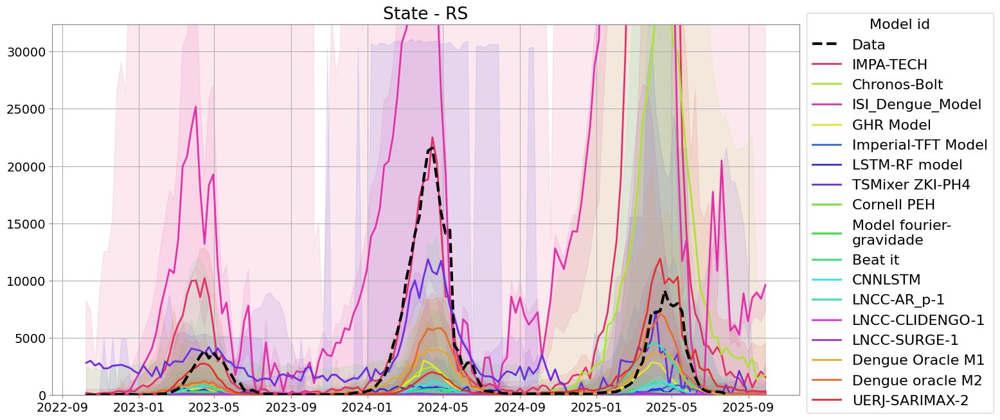

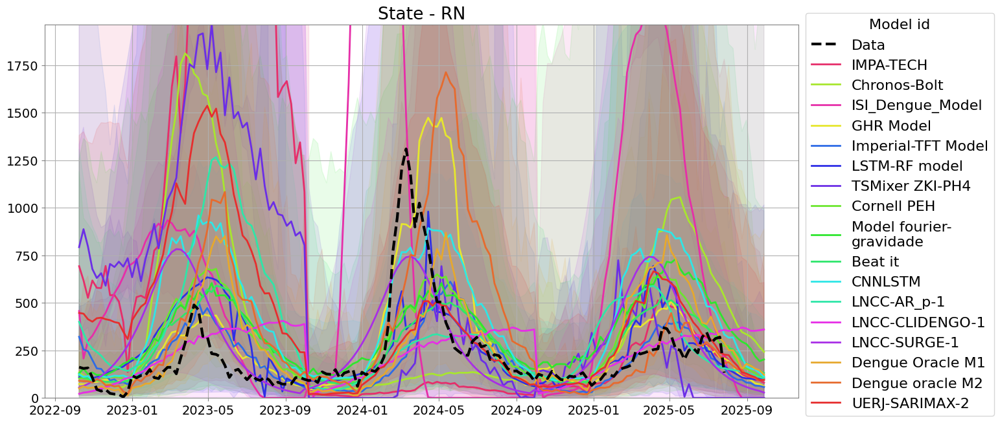

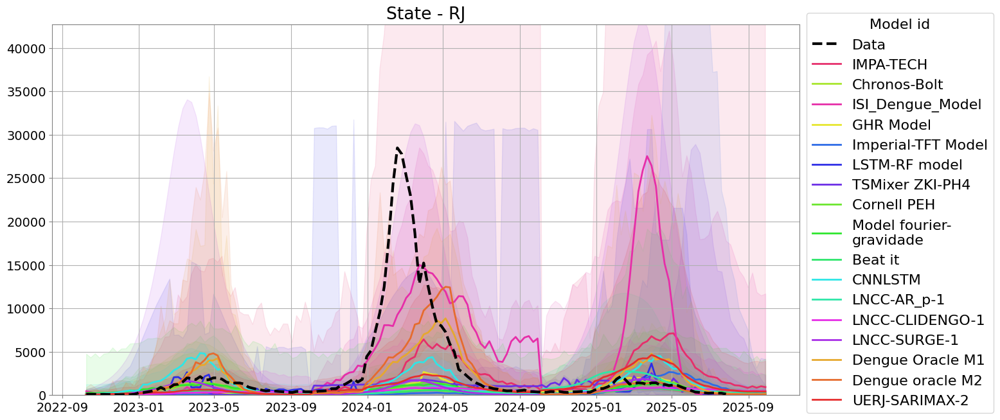

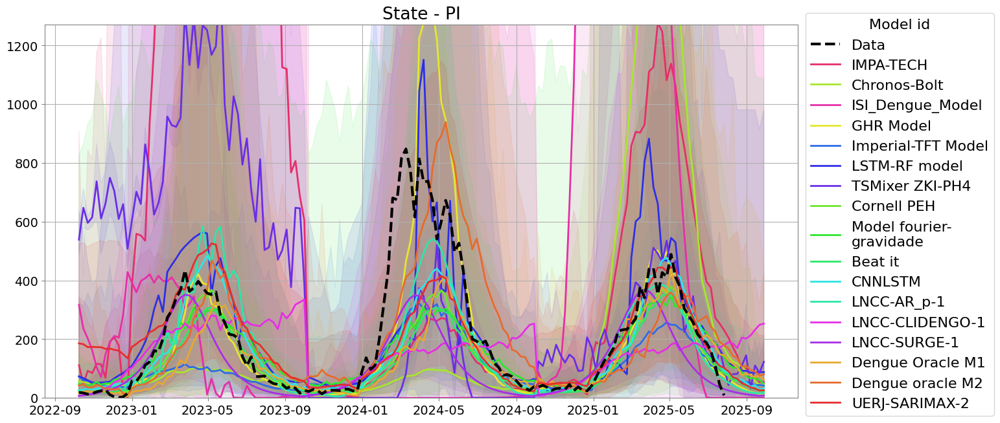

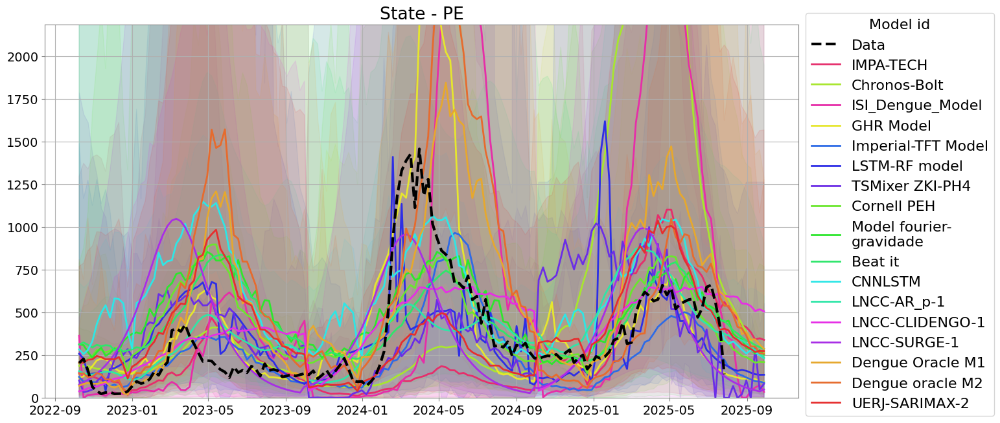

...

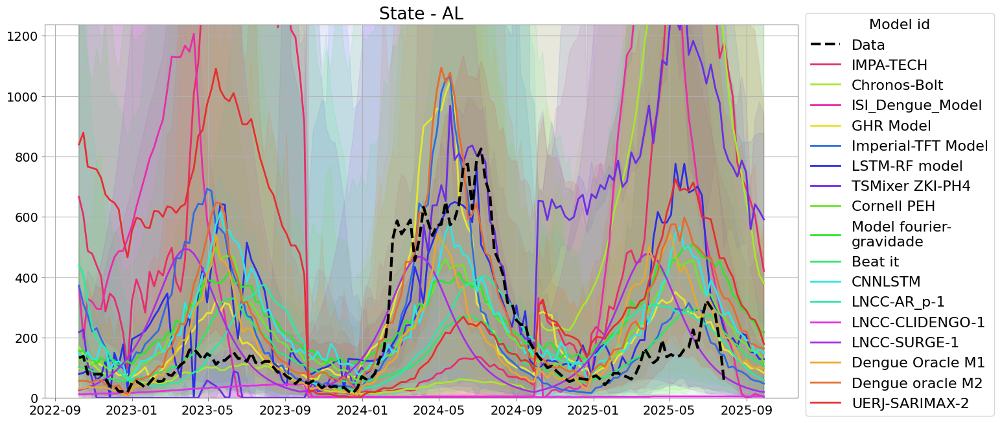

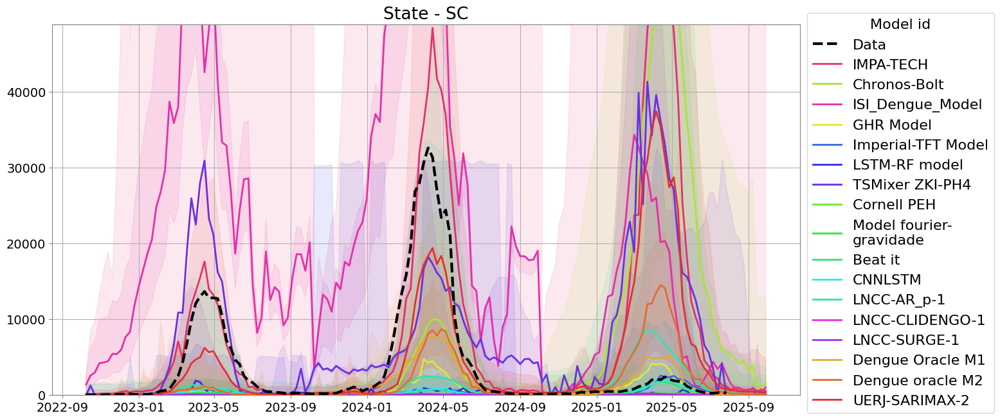

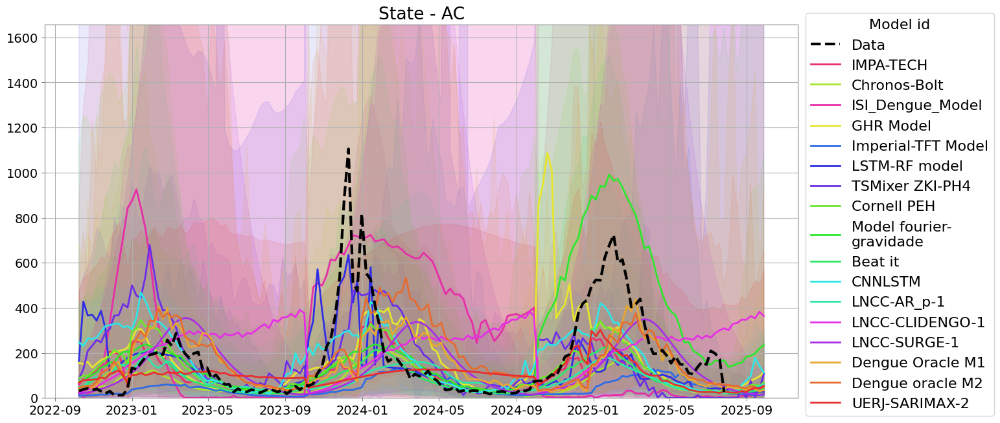

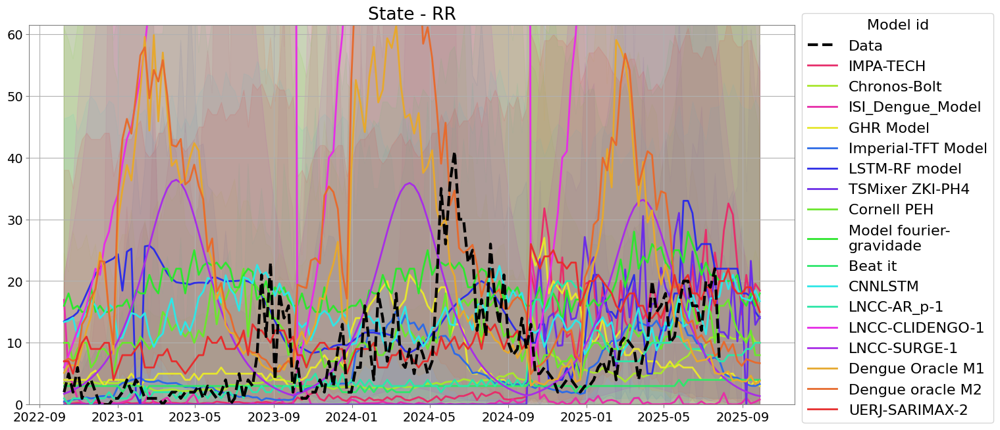

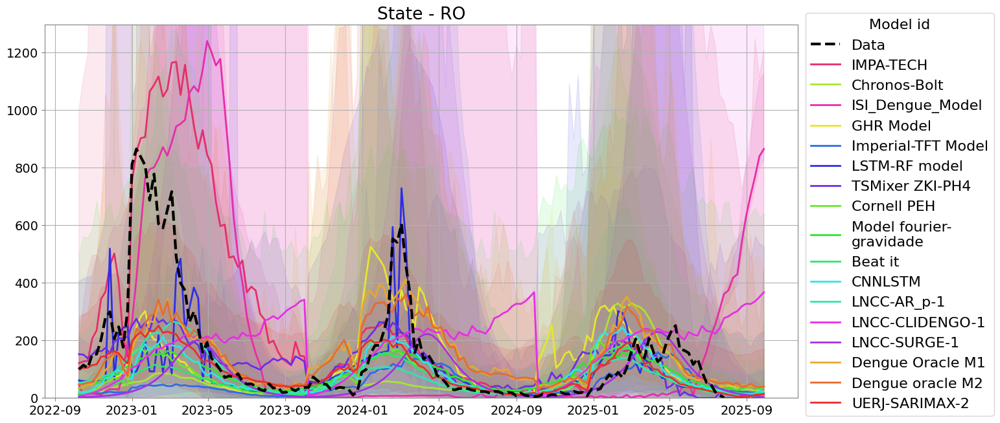

In [9]:

for state in df_preds.state.unique():
    
    _,ax = plt.subplots(figsize = (15, 7.5))
    
    plot_preds_by_state(ax, state, data_23_25, df_preds)

    plt.savefig(f'figures/preds_{state}.png', dpi = 450, bbox_inches = 'tight')
    
    plt.show()

### Plot top 5 models only:

In [10]:
def plot_preds_by_state(ax, state, data_23_25, df_preds, top_5_models):
    
    data_ = data_23_25.loc[data_23_25.uf == state] 
    df_preds_ = df_preds.loc[(df_preds.state == state)]


    ax.plot( data_.date, data_.casos, linestyle = '--', color = 'black', label = 'Data', linewidth = 3, zorder = 20)


    for model in top_5_models: 
        df_pred_model = df_preds_.loc[df_preds_.model_id == model].sort_values(by='date')
        ax.plot(df_pred_model.date, df_pred_model.pred, label = model, color = color_palette[model], linewidth =2)
        ax.fill_between(df_pred_model.date, df_pred_model.lower_95, df_pred_model.upper_95, color = color_palette[model], alpha =0.1)


    for model in df_preds_.model_id.unique():

       
        if model not in top_5_models: 
            df_pred_model = df_preds_.loc[df_preds_.model_id == model].sort_values(by='date')

            ax.plot(df_pred_model.date, df_pred_model.pred, color = 'gray', linewidth =1.5, zorder = -1)

        
    ax.plot(df_pred_model.date, df_pred_model.pred, label = 'Other\nmodels', color = 'gray', linewidth = 1.5, zorder = -1)
    
    ax.legend(bbox_to_anchor = (1,1), title = 'Model id')
    
    ax.grid()

    ax.set_title(f'State - {state}')

    ax.set_ylim([0, 1.5*max(data_.casos)])

    for label in ax.get_xticklabels():
        label.set_rotation(30)

    return 
    

In [11]:
df_top_models = pd.read_csv('results/best_models_by_region.csv', index_col = 'Unnamed: 0')
df_top_models = df_top_models.replace(dict_models_name)
df_top_models.head()

,Nordeste,Sudeste,Sul,Centro-Oeste,Norte
0,GHR Model,Dengue oracle M2,Dengue Oracle M1,GHR Model,LNCC-AR_p-1
1,LNCC-AR_p-1,LNCC-SURGE-1,LSTM-RF model,LSTM-RF model,Beat it
2,Cornell PEH,Dengue Oracle M1,LNCC-AR_p-1,Dengue oracle M2,Imperial-TFT Model
3,Imperial-TFT Model,GHR Model,Beat it,UERJ-SARIMAX-2,Dengue Oracle M1
4,CNNLSTM,UERJ-SARIMAX-2,UERJ-SARIMAX-2,Chronos-Bolt,Cornell PEH


In [12]:
dict_state_reg = {'TO': 'Norte', 'CE': 'Nordeste', 'MS':'Centro-Oeste', 'MG':'Sudeste', 'RS':'Sul'}

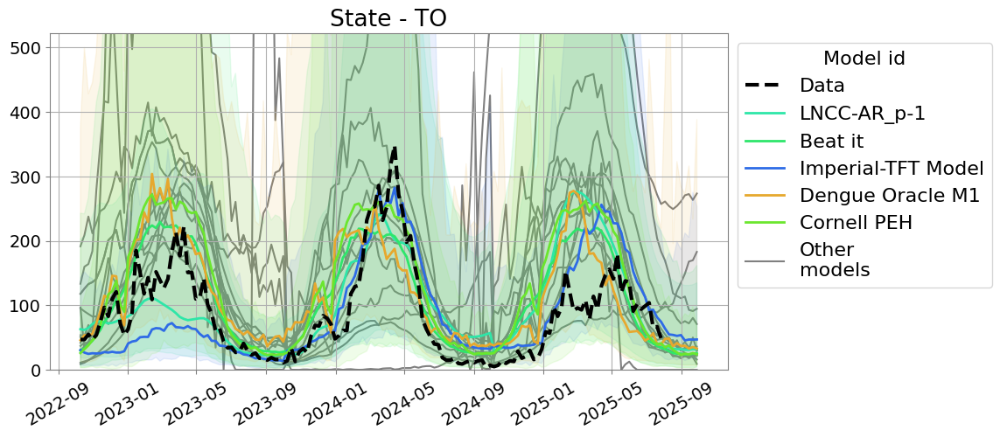

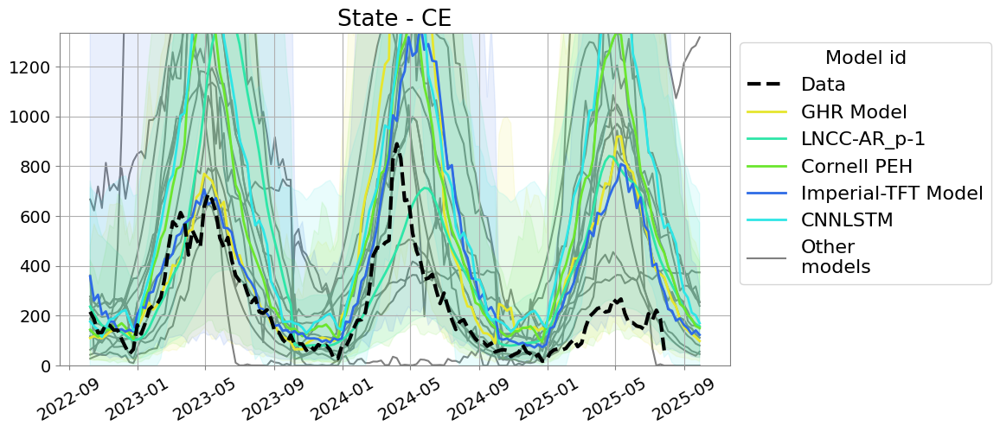

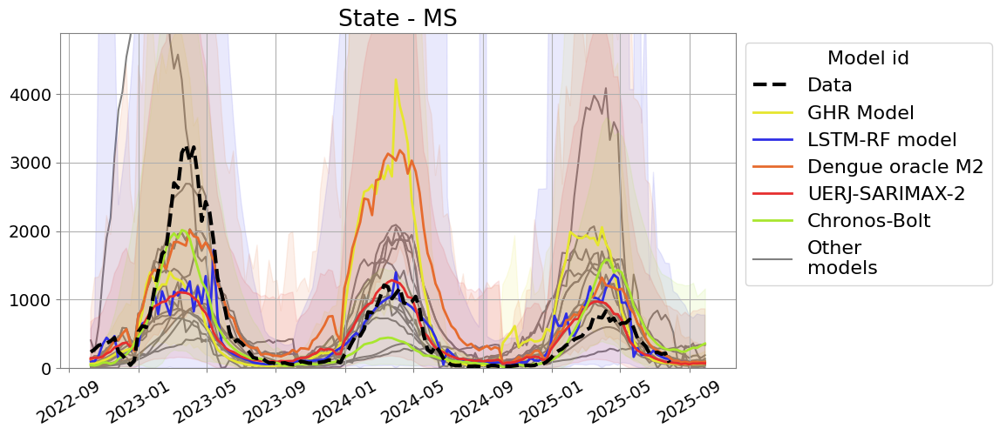

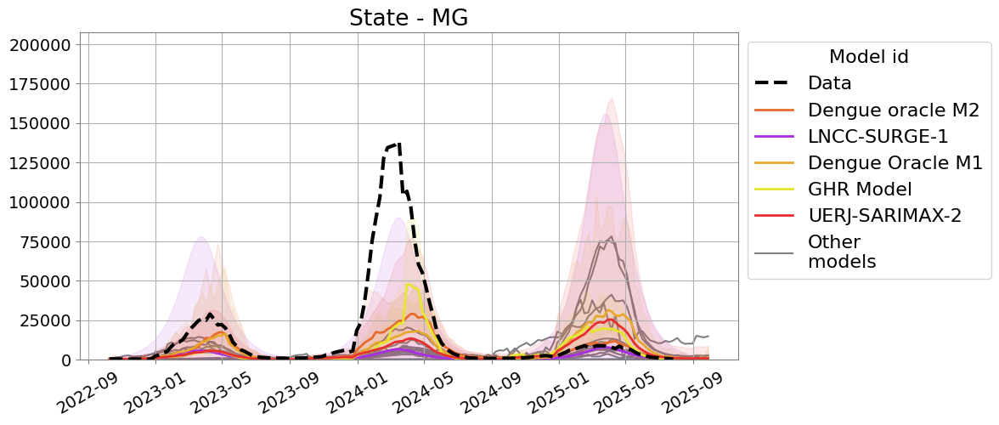

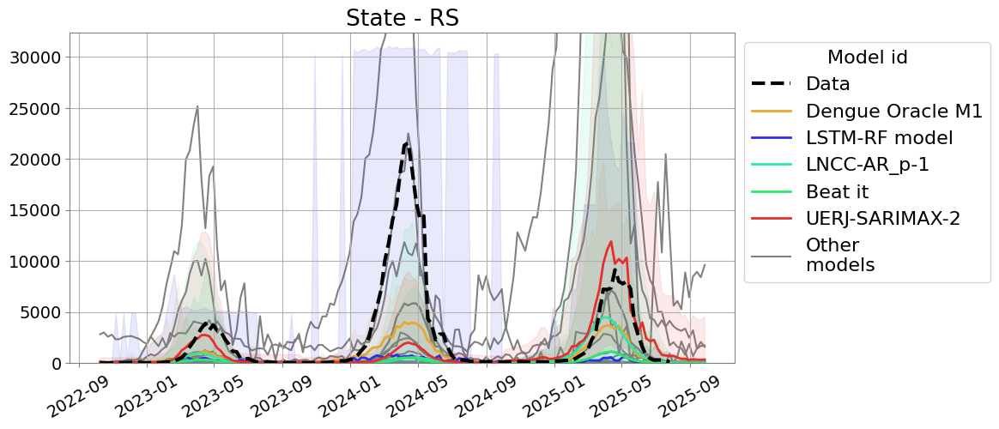

In [13]:
for state in dict_state_reg.keys(): 
    
    _,ax = plt.subplots(figsize = (10, 5))

    plot_preds_by_state(ax, state, data_23_25, df_preds, top_5_models = df_top_models[dict_state_reg[state]].values)

    plt.savefig(f'figures/preds_top_5_{state}.png', dpi = 450, bbox_inches = 'tight')